# Super Resolution Generative Adversarial Network
<b>Optimizer:</b> Adam <br/>
<b>Dataset:</b> CelebFaces Attributes (CelebA) Dataset <br/>
<b>link to dataset on kaggle:</b> https://www.kaggle.com/datasets/jessicali9530/celeba-dataset

# About Dataset
This dataset has 202,599 face images of various celebrities.

# Environment

In [1]:
%matplotlib inline
!pip install lightning==2.2.5 torchmetrics==1.4.0.post0 torch-ema

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 37.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 39.4 MB/s eta 0:00:00
  Attempting uninstall: torchmetrics
    Found existing installation: torchmetrics 1.3.2
    Uninstalling torchmetrics-1.3.2:
      Successfully uninstalled torchmetrics-1.3.2


# Imports

In [2]:
import torch
import random
import os
import PIL
import math
import cv2

import lightning as L
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.utils as vutils
import torchvision.transforms as transforms

from numpy import ndarray
from torch import Tensor
from tqdm import tqdm
from collections import OrderedDict
from contextlib import nullcontext
from typing import Any, cast, Dict, List, Union
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim.lr_scheduler import MultiStepLR
from torchvision.models.feature_extraction import create_feature_extractor
from torchvision.transforms import functional as F_vision
from lightning.pytorch.core import LightningModule
from lightning.pytorch.callbacks import RichProgressBar, ModelCheckpoint
from torch_ema import ExponentialMovingAverage
from pytorch_lightning.loggers import TensorBoardLogger

from torchmetrics.image import StructuralSimilarityIndexMeasure as SSIM, PeakSignalNoiseRatio as PSNR

In [3]:
# Make device agnostic code
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DEVICE

'cuda'

# Reproducibility

In [4]:
RAND_CONST = 10

# Worker initialization function for data loaders (simplest approach)
def seed_worker(worker_id):
    worker_seed = (torch.initial_seed() + worker_id) % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g_train = torch.Generator().manual_seed(RAND_CONST)
g_val = torch.Generator().manual_seed(RAND_CONST + 1)

In [5]:
# Seed the RNG for all devices (both CPU and CUDA)
torch.manual_seed(RAND_CONST)
# Set python seed
random.seed(RAND_CONST)
# Set numpy seed
np.random.seed(RAND_CONST)
# Force cuDNN to deterministically select an algorithm
# *possibly at the cost of reduced performance
torch.backends.cudnn.benchmark = False
# Configure PyTorch to use deterministic algorithms
# torch.use_deterministic_algorithms(True) (involves env. variables, so not used)

# Model

In [6]:
# Dictionary of the configuration of the feature extraction network
feature_extractor_net_cfgs: Dict[str, List[Union[str, int]]] = {
    "vgg19": [64, 64, "M", 128, 128, "M", 256, 256, 256, 256, "M", 512, 512, 512, 512, "M", 512, 512, 512, 512, "M"],
}

# Creates a VGG model with the specified feature extraction layers
def _make_layers(net_cfg_name: str, batch_norm: bool = False) -> nn.Sequential: # VGG19 is used in article
    net_cfg = feature_extractor_net_cfgs[net_cfg_name]
    layers: nn.Sequential[nn.Module] = nn.Sequential()
    in_channels = 3
    for v in net_cfg:
        if v == "M":
            layers.append(nn.MaxPool2d((2, 2), (2, 2)))
        else:
            v = cast(int, v)
            conv2d = nn.Conv2d(in_channels, v, (3, 3), (1, 1), (1, 1))
            if batch_norm:
                layers.append(conv2d)
                layers.append(nn.BatchNorm2d(v))
                layers.append(nn.ReLU(True))
            else:
                layers.append(conv2d)
                layers.append(nn.ReLU(True))
            in_channels = v

    return layers


class _FeatureExtractor(nn.Module):
    def __init__(
            self,
            net_cfg_name: str = "vgg19",
            batch_norm: bool = False,
            num_classes: int = 1000) -> None:
        super(_FeatureExtractor, self).__init__()
        self.features = _make_layers(net_cfg_name, batch_norm)

        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))

        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes),
        )

        # Initialize neural network weights
        for module in self.modules():
            if isinstance(module, nn.Conv2d):
                nn.init.kaiming_normal_(module.weight, mode="fan_out", nonlinearity="relu")
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.BatchNorm2d):
                nn.init.constant_(module.weight, 1)
                nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.Linear):
                nn.init.normal_(module.weight, 0, 0.01)
                nn.init.constant_(module.bias, 0)

    def forward(self, x: Tensor) -> Tensor:
        return self._forward_impl(x)

    # Support torch.script function
    def _forward_impl(self, x: Tensor) -> Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)

        return x


class SRResNet(nn.Module):
    def __init__(
            self,
            in_channels: int = 3,
            out_channels: int = 3,
            channels: int = 64,
            num_rcb: int = 16,
            upscale: int = 4,
    ) -> None:
        super(SRResNet, self).__init__()
        # Low frequency information extraction layer
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, channels, (9, 9), (1, 1), (4, 4)),
            nn.PReLU(),
        )

        # High frequency information extraction block
        trunk = []
        for _ in range(num_rcb):
            trunk.append(_ResidualConvBlock(channels))
        self.trunk = nn.Sequential(*trunk)

        # High-frequency information linear fusion layer
        self.conv2 = nn.Sequential(
            nn.Conv2d(channels, channels, (3, 3), (1, 1), (1, 1), bias=False),
            nn.BatchNorm2d(channels),
        )

        # zoom block
        upsampling = []
        if upscale == 2 or upscale == 4 or upscale == 8:
            for _ in range(int(math.log(upscale, 2))):
                upsampling.append(_UpsampleBlock(channels, 2))
        else:
            raise NotImplementedError(f"Upscale factor `{upscale}` is not support.")
        self.upsampling = nn.Sequential(*upsampling)

        # reconstruction block
        self.conv3 = nn.Conv2d(channels, out_channels, (9, 9), (1, 1), (4, 4))

        # Initialize neural network weights
        for module in self.modules():
            if isinstance(module, nn.Conv2d):
                nn.init.kaiming_normal_(module.weight)
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.BatchNorm2d):
                nn.init.constant_(module.weight, 1)

    def forward(self, x: Tensor) -> Tensor:
        return self._forward_impl(x)

    # Support torch.script function
    def _forward_impl(self, x: Tensor) -> Tensor:
        conv1 = self.conv1(x)
        x = self.trunk(conv1)
        x = self.conv2(x)
        x = torch.add(x, conv1)
        x = self.upsampling(x)
        x = self.conv3(x)

        x = torch.clamp_(x, 0.0, 1.0)
#         x = torch.tanh(x)

        return x


class DiscriminatorForVGG(nn.Module):
    def __init__(
            self,
            in_channels: int = 3,
            out_channels: int = 1,
            channels: int = 64,
    ) -> None:
        super(DiscriminatorForVGG, self).__init__()
        self.features = nn.Sequential(
            # input size. (3) x 96 x 96
            nn.Conv2d(in_channels, channels, (3, 3), (1, 1), (1, 1), bias=True),
            nn.LeakyReLU(0.2, True),
            # state size. (64) x 48 x 48
            nn.Conv2d(channels, channels, (3, 3), (2, 2), (1, 1), bias=False),
            nn.BatchNorm2d(channels),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(channels, int(2 * channels), (3, 3), (1, 1), (1, 1), bias=False),
            nn.BatchNorm2d(int(2 * channels)),
            nn.LeakyReLU(0.2, True),
            # state size. (128) x 24 x 24
            nn.Conv2d(int(2 * channels), int(2 * channels), (3, 3), (2, 2), (1, 1), bias=False),
            nn.BatchNorm2d(int(2 * channels)),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(int(2 * channels), int(4 * channels), (3, 3), (1, 1), (1, 1), bias=False),
            nn.BatchNorm2d(int(4 * channels)),
            nn.LeakyReLU(0.2, True),
            # state size. (256) x 12 x 12
            nn.Conv2d(int(4 * channels), int(4 * channels), (3, 3), (2, 2), (1, 1), bias=False),
            nn.BatchNorm2d(int(4 * channels)),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(int(4 * channels), int(8 * channels), (3, 3), (1, 1), (1, 1), bias=False),
            nn.BatchNorm2d(int(8 * channels)),
            nn.LeakyReLU(0.2, True),
            # state size. (512) x 6 x 6
            nn.Conv2d(int(8 * channels), int(8 * channels), (3, 3), (2, 2), (1, 1), bias=False),
            nn.BatchNorm2d(int(8 * channels)),
            nn.LeakyReLU(0.2, True),
        )

        self.classifier = nn.Sequential(
            nn.Linear(int(8 * channels) * 6 * 6, 1024), # was 1024 instead of channels
            nn.LeakyReLU(0.2, True),
            nn.Linear(1024, out_channels), # was 1024 instead of channels
        )

    def forward(self, x: Tensor) -> Tensor:
        # Input image size must equal 96
        assert x.size(2) == 96 and x.size(3) == 96, "Input image size must be is 96x96"

        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)

        return x


class _ResidualConvBlock(nn.Module):
    def __init__(self, channels: int) -> None:
        super(_ResidualConvBlock, self).__init__()
        self.rcb = nn.Sequential(
            nn.Conv2d(channels, channels, (3, 3), (1, 1), (1, 1), bias=False),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, (3, 3), (1, 1), (1, 1), bias=False),
            nn.BatchNorm2d(channels),
        )

    def forward(self, x: Tensor) -> Tensor:
        identity = x
        x = self.rcb(x)
        x = torch.add(x, identity)
        return x


class _UpsampleBlock(nn.Module):
    def __init__(self, channels: int, upscale_factor: int) -> None:
        super(_UpsampleBlock, self).__init__()
        self.upsample_block = nn.Sequential(
            nn.Conv2d(channels, channels * upscale_factor * upscale_factor, (3, 3), (1, 1), (1, 1)),
            nn.PixelShuffle(upscale_factor),
            nn.PReLU(),
        )

    def forward(self, x: Tensor) -> Tensor:
        x = self.upsample_block(x)

        return x


class ContentLoss(nn.Module):
    """Constructs a content loss function based on the VGG19 network.
    Using high-level feature mapping layers from the latter layers will focus more on the texture content of the image.
     """

    def __init__(
            self,
            net_cfg_name: str,
            batch_norm: bool,
            num_classes: int,
            feature_nodes: list,
            feature_normalize_mean: list,
            feature_normalize_std: list,
            model_weights_path: str = "",
    ) -> None:
        super(ContentLoss, self).__init__()
        # Define the feature extraction model
        model = _FeatureExtractor(net_cfg_name, batch_norm, num_classes)
        # Load the pre-trained model
        if model_weights_path == "":
            model = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)
        elif model_weights_path is not None and os.path.exists(model_weights_path):
            checkpoint = torch.load(model_weights_path, map_location=lambda storage, loc: storage)
            if "state_dict" in checkpoint.keys():
                model.load_state_dict(checkpoint["state_dict"])
            else:
                model.load_state_dict(checkpoint)
        else:
            raise FileNotFoundError("Model weight file not found")
        # Extract the output of the feature extraction layer
        self.feature_extractor = create_feature_extractor(model, feature_nodes)
        # Select the specified layers as the feature extraction layer
        self.feature_extractor_nodes = feature_nodes
        # input normalization
        self.normalize = transforms.Normalize(feature_normalize_mean, feature_normalize_std)
        # Freeze model parameters without derivatives
        for model_parameters in self.feature_extractor.parameters():
            model_parameters.requires_grad = False
        self.feature_extractor.eval()

    def forward(self, sr_tensor: Tensor, gt_tensor: Tensor) -> [Tensor]:
        assert sr_tensor.size() == gt_tensor.size(), "Two tensor must have the same size"
        device = sr_tensor.device

        losses = []
        # input normalization
        sr_tensor = self.normalize(sr_tensor)
        gt_tensor = self.normalize(gt_tensor)

        # Get the output of the feature extraction layer
        sr_feature = self.feature_extractor(sr_tensor)
        gt_feature = self.feature_extractor(gt_tensor)

        # Compute feature loss
        for i in range(len(self.feature_extractor_nodes)):
            losses.append(F.mse_loss(sr_feature[self.feature_extractor_nodes[i]],
                                           gt_feature[self.feature_extractor_nodes[i]])) # SRGAN_5,4 provided best results
                                                                                         # e.g. the last conv map (15th overall
        losses = torch.Tensor([losses]).to(device)                                       # / 4th in block 5)

        return losses

# Transformations

In [7]:
def random_crop_torch(
        gt_images,
        lr_images,
        gt_patch_size: int,
        upscale_factor: int,
        flag_no_rand: bool = False
) -> [ndarray, ndarray] or [Tensor, Tensor] or [list[ndarray], list[ndarray]] or [list[Tensor], list[Tensor]]:
    """Randomly crop bigger gt_images and smaller lr_images with respect to position 

    Args:
        gt_images (ndarray | Tensor | list[ndarray] | list[Tensor]): ground truth images read by PyTorch
        lr_images (ndarray | Tensor | list[ndarray] | list[Tensor]): Low resolution images read by PyTorch
        gt_patch_size (int): the size of the ground truth image after interception
        upscale_factor (int): the ground truth image size is a magnification of the low resolution image size

    Returns:
        gt_images (ndarray or Tensor or): the intercepted ground truth image
        lr_images (ndarray or Tensor or): low-resolution intercepted images

    """
    # Handle the case where the input is not a list
    if not isinstance(gt_images, list):
        gt_images = [gt_images]
    if not isinstance(lr_images, list):
        lr_images = [lr_images]

    # detect input image type
    input_type = "Tensor" if torch.is_tensor(lr_images[0]) else "Numpy" # REMOVE IN THE FUTURE

    if input_type == "Tensor":
        lr_image_height, lr_image_width = lr_images[0].size()[-2:]
    else:
        # lr_image_height, lr_image_width = lr_images[0].shape[0:2]
        raise Exception("Numpy is not supported") # REMOVE IN THE FUTURE

    # Calculate the size of the low-resolution image that needs to be intercepted
    lr_patch_size = gt_patch_size // upscale_factor

    # Calculate the center of the image
    center_y, center_x = lr_image_height // 2, lr_image_width // 2
    # Calculate the standard deviation to be 1/6 of the image size, so that ~99.7% of values will be within the image
    std_dev_y, std_dev_x = lr_image_height // 6, lr_image_width // 6
    # Generate the top and left coordinates from a normal distribution centered at the middle of the image
    if not flag_no_rand:
        lr_top = np.clip(int(np.random.normal(center_y, std_dev_y) - lr_patch_size//2), 0, lr_image_height - lr_patch_size)
        lr_left = np.clip(int(np.random.normal(center_x, std_dev_x) - lr_patch_size//2), 0, lr_image_width - lr_patch_size)
    else:
        lr_top = np.clip(int(center_y - lr_patch_size//2), 0, lr_image_height - lr_patch_size)
        lr_left = np.clip(int(center_x - lr_patch_size//2), 0, lr_image_width - lr_patch_size)
        
    # Capture low-resolution images
    if input_type == "Tensor":
        lr_images = [lr_image[
                     :,
                     :,
                     lr_top: lr_top + lr_patch_size,
                     lr_left: lr_left + lr_patch_size] for lr_image in lr_images]
    else:
        raise Exception("Numpy is not supported")

    # Intercept the ground truth image
    gt_top, gt_left = int(lr_top * upscale_factor), int(lr_left * upscale_factor)

    if input_type == "Tensor":
        gt_images = [v[
                     :,
                     :,
                     gt_top: gt_top + gt_patch_size,
                     gt_left: gt_left + gt_patch_size] for v in gt_images]
    else:
        raise Exception("Numpy is not supported")

    # When the input has only one image
    if len(gt_images) == 1:
        gt_images = gt_images[0]
    if len(lr_images) == 1:
        lr_images = lr_images[0]

    return gt_images, lr_images


def random_rotate_torch(
        gt_images,
        lr_images,
        upscale_factor: int,
        angles: list,
        gt_center: tuple = None,
        lr_center: tuple = None,
        rotate_scale_factor: float = 1.0
) -> [ndarray, ndarray] or [Tensor, Tensor] or [list[ndarray], list[ndarray]] or [list[Tensor], list[Tensor]]:
    """Randomly rotate the image

    Args:
        gt_images (ndarray | Tensor | list[ndarray] | list[Tensor]): ground truth images read by the PyTorch library
        lr_images (ndarray | Tensor | list[ndarray] | list[Tensor]): low-resolution images read by the PyTorch library
        angles (list): List of random rotation angles
        upscale_factor (int): the ground truth image size is a magnification of the low resolution image size
        gt_center (optional, tuple[int, int]): The center point of the ground truth image selection. Default: ``None``
        lr_center (optional, tuple[int, int]): Low resolution image selection center point. Default: ``None``
        rotate_scale_factor (optional, float): Rotation scaling factor. Default: 1.0

    Returns:
        gt_images (ndarray or Tensor or): ground truth image after rotation
        lr_images (ndarray or Tensor or): Rotated low-resolution images

    """
    # Randomly choose the rotation angle
    angle = random.choice(angles)

    if not isinstance(gt_images, list):
        gt_images = [gt_images]
    if not isinstance(lr_images, list):
        lr_images = [lr_images]

    # detect input image type
    input_type = "Tensor" if torch.is_tensor(lr_images[0]) else "Numpy"

    if input_type == "Tensor":
        lr_image_height, lr_image_width = lr_images[0].size()[-2:]
    else:
        raise Exception("Numpy is not supported")

    # Rotate the low-res image
    if lr_center is None:
        lr_center = [lr_image_width // 2, lr_image_height // 2]

    lr_matrix = cv2.getRotationMatrix2D(lr_center, angle, rotate_scale_factor)

    if input_type == "Tensor":
        lr_images = [F_vision.rotate(lr_image, angle, center=lr_center) for lr_image in lr_images]
    else:
        raise Exception("Numpy is not supported")

    # rotate the ground truth image
    gt_image_width = int(lr_image_width * upscale_factor)
    gt_image_height = int(lr_image_height * upscale_factor)

    if gt_center is None:
        gt_center = [gt_image_width // 2, gt_image_height // 2]

    gt_matrix = cv2.getRotationMatrix2D(gt_center, angle, rotate_scale_factor)

    if input_type == "Tensor":
        gt_images = [F_vision.rotate(gt_image, angle, center=gt_center) for gt_image in gt_images]
    else:
        raise Exception("Numpy is not supported")

    # When the input has only one image
    if len(gt_images) == 1:
        gt_images = gt_images[0]
    if len(lr_images) == 1:
        lr_images = lr_images[0]

    return gt_images, lr_images


def random_horizontally_flip_torch(
        gt_images,
        lr_images,
        p: float = 0.5
) -> [ndarray, ndarray] or [Tensor, Tensor] or [list[ndarray], list[ndarray]] or [list[Tensor], list[Tensor]]:
    """Randomly flip the image up and down

    Args:
        gt_images (ndarray): ground truth images read by the PyTorch library
        lr_images (ndarray): low resolution images read by the PyTorch library
        p (optional, float): flip probability. Default: 0.5

    Returns:
        gt_images (ndarray or Tensor or): flipped ground truth images
        lr_images (ndarray or Tensor or): flipped low-resolution images

    """
    # Randomly generate flip probability
    flip_prob = random.random()

    if not isinstance(gt_images, list):
        gt_images = [gt_images]
    if not isinstance(lr_images, list):
        lr_images = [lr_images]

    # detect input image type
    input_type = "Tensor" if torch.is_tensor(lr_images[0]) else "Numpy"

    if flip_prob > p:
        if input_type == "Tensor":
            lr_images = [F_vision.hflip(lr_image) for lr_image in lr_images]
            gt_images = [F_vision.hflip(gt_image) for gt_image in gt_images]
        else:
            raise Exception("Numpy is not supported")

    # When the input has only one image
    if len(gt_images) == 1:
        gt_images = gt_images[0]
    if len(lr_images) == 1:
        lr_images = lr_images[0]

    return gt_images, lr_images


def random_vertically_flip_torch(
        gt_images,
        lr_images,
        p: float = 0.5
) -> [ndarray, ndarray] or [Tensor, Tensor] or [list[ndarray], list[ndarray]] or [list[Tensor], list[Tensor]]:
    """Randomly flip the image left and right

    Args:
        gt_images (ndarray): ground truth images read by the PyTorch library
        lr_images (ndarray): low resolution images read by the PyTorch library
        p (optional, float): flip probability. Default: 0.5

    Returns:
        gt_images (ndarray or Tensor or): flipped ground truth images
        lr_images (ndarray or Tensor or): flipped low-resolution images

    """
    # Randomly generate flip probability
    flip_prob = random.random()

    if not isinstance(gt_images, list):
        gt_images = [gt_images]
    if not isinstance(lr_images, list):
        lr_images = [lr_images]

    # detect input image type
    input_type = "Tensor" if torch.is_tensor(lr_images[0]) else "Numpy"

    if flip_prob > p:
        if input_type == "Tensor":
            lr_images = [F_vision.vflip(lr_image) for lr_image in lr_images]
            gt_images = [F_vision.vflip(gt_image) for gt_image in gt_images]
        else:
            raise Exception("Numpy is not supported")

    # When the input has only one image
    if len(gt_images) == 1:
        gt_images = gt_images[0]
    if len(lr_images) == 1:
        lr_images = lr_images[0]

    return gt_images, lr_images


def load_state_dict_mod(
        model: nn.Module,
        compile_mode: bool,
        state_dict: dict,
):
    """Load model weights and parameters

    Args:
        model (nn.Module): model
        compile_mode (bool): Enable model compilation mode, `False` means not compiled, `True` means compiled
        state_dict (dict): model weights and parameters waiting to be loaded

    Returns:
        model (nn.Module): model after loading weights and parameters
    """

    # Define compilation status keywords
    compile_state = "_orig_mod"

    # Process parameter dictionary
    model_state_dict = model.state_dict()
    new_state_dict = OrderedDict()

    # Check if the model has been compiled
    for k, v in state_dict.items():
        current_compile_state = k.split(".")[0]
        if compile_mode and current_compile_state != compile_state:
            raise RuntimeError("The model is not compiled. Please use `model = torch.compile(model)`.")

        # load the model
#         if compile_mode and current_compile_state != compile_state:
#         name = compile_state + "." + k
#         elif not compile_mode and current_compile_state == compile_state:
        name = k[10:]
#         else:
#         name = k
        new_state_dict[name] = v
    state_dict = new_state_dict

    # Traverse the model parameters, load the parameters in the pre-trained model into the current model
    new_state_dict = {k: v for k, v in state_dict.items() if
                      k in model_state_dict.keys() and v.size() == model_state_dict[k].size()}

    # update model parameters
    model_state_dict.update(new_state_dict)
    model.load_state_dict(model_state_dict)

    return model

# Dataset class

In [8]:
IMAGE_SIZE_CROP = 96
BATCH_SIZE = 16
DATA_DIR = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba"

class CelebADataset(Dataset):
    def __init__(self, root_dir, downscale_factor=4):
        self.root_dir = root_dir
        self.downscale_factor = downscale_factor
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith('.jpg')]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = PIL.Image.open(img_path).convert('RGB')

        # Downsample the image using bicubic interpolation
        downsampled_img = img.resize((img.width // self.downscale_factor, img.height // self.downscale_factor), PIL.Image.BICUBIC)

        # Convert the images to PyTorch tensors
        to_tensor = transforms.ToTensor()
        img = to_tensor(img)
        downsampled_img = to_tensor(downsampled_img) # scale [0, 1]
        
        # Normalize the images
#         normalize_img = transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # To scale [-1, 1]
#         img = normalize_img(img)

        return img, downsampled_img

dataset = CelebADataset(DATA_DIR)

# Define the ratio for the split
train_ratio = 0.8
total_size = len(dataset)
train_size = int(total_size * train_ratio)
control_size = 5
val_size = total_size - train_size - control_size

# # Split the dataset
train_dataset, val_dataset = random_split(dataset, [train_size, val_size + control_size])
val_dataset, control_set = random_split(val_dataset, [val_size, control_size])

# Create a sampler, that provides an iterable over train dataset (used in AdversaryTraining)
train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True, num_workers=3,
    worker_init_fn=seed_worker, generator=g_train)

# Create a sampler, that provides an iterable over train dataset (used in AdversaryTraining)
val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False, num_workers=3,
    worker_init_fn=seed_worker, generator=g_val)

# Data visualization

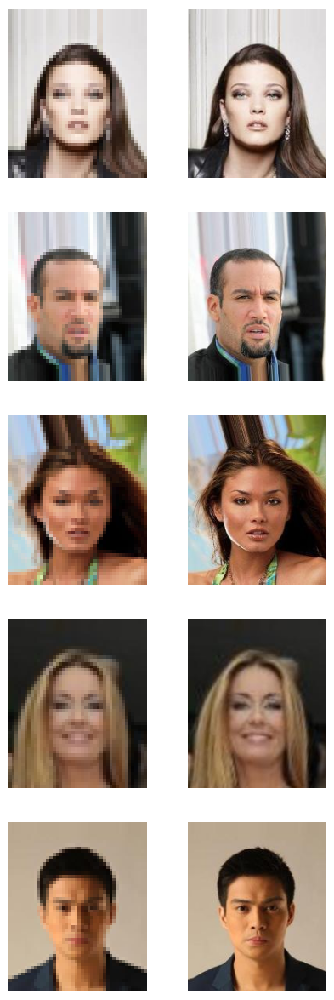

In [9]:
# MEAN_TRN = np.array([0.5, 0.5, 0.5])
# STD_TRN = np.array([0.5, 0.5, 0.5])
MEAN_TRN = np.array([0.0, 0.0, 0.0])
STD_TRN = np.array([1.0, 1.0, 1.0])
def custom_imshow(img, title=None, norm=False):
    if norm:
        img = img * STD_TRN[:,None,None] + MEAN_TRN[:,None,None]
    plt.imshow(img.permute(1, 2, 0))
    if title is not None:
        plt.title(title)
        
# Get some training images
dataiter = iter(train_loader)
hr_images, lr_images = next(dataiter)

# Show images in a grid 5x2
fig = plt.figure(figsize=(5, 15))
rows, cols = 5, 2
for i in range(0, rows):
    fig.add_subplot(rows, cols, 2 * i + 1)
    custom_imshow(lr_images[i])
    plt.axis(False)
    fig.add_subplot(rows, cols, 2 * i + 2)
    custom_imshow(hr_images[i], norm=True)
    plt.axis(False)

# Lightning Module for Adversary training

In [10]:
PIXEL_LOSS_WEIGHT = 1.0 # 1.0
CONTENT_LOSS_WEIGHT = 1.0 # 0.006
ADVERSARIAL_LOSS_WEIGHT = 0.001 # 0.001
UPSCALE = 4
DECAY_VAL = 0.999

class LitGAN(LightningModule): 
    def __init__(
        self,
        generator: nn.Module,
        discriminator: nn.Module,
        control_set: Dataset,
        output_epoch: int = 5,
        pixel_loss = nn.MSELoss,
        content_loss = ContentLoss,
        adversarial_loss = nn.BCEWithLogitsLoss,
        load_pretrain_gen: bool = True,
        load_pretrain_disc: bool = False,
        perform_ema: bool = False
    ):
        super().__init__()
        self.generator = generator # Define used models
        self.discriminator = discriminator
        self.pixel_loss = pixel_loss() # Define used criterions
        self.content_loss = content_loss(
            net_cfg_name="vgg19",
            batch_norm=False,
            num_classes=1000,
            feature_nodes=["features.35"],
            feature_normalize_mean=[0.485, 0.456, 0.406],
            feature_normalize_std=[0.229, 0.224, 0.225]
        ).to(DEVICE)
        self.adversarial_loss = adversarial_loss()
        self.control_loader = DataLoader(control_set, batch_size=5, shuffle=False, drop_last=False)
        self.output_epoch = output_epoch
        self.perform_ema = perform_ema

        if load_pretrain_gen:
            gen_weights = torch.load("/kaggle/input/pretrained-srgan/SRResNet_x4-SRGAN_ImageNet.pth.tar", map_location=lambda storage, loc: storage)["state_dict"]
            self.generator = load_state_dict_mod(self.generator, True, gen_weights)
        if load_pretrain_disc:
            disc_weights = torch.load("/kaggle/input/pretrained-srgan/DiscriminatorForVGG_x4-SRGAN_ImageNet.pth.tar", map_location=lambda storage, loc: storage)["state_dict"]
            self.discriminator = load_state_dict_mod(self.discriminator, False, disc_weights)
            
        if perform_ema:
            self.ema = ExponentialMovingAverage(self.generator.parameters(), decay=DECAY_VAL)
        self.inference_manager = self.ema.average_parameters if perform_ema else nullcontext
        # Important: This property activates manual optimization.
        self.automatic_optimization = False

    def forward(self, x):
        return self.generator(x)

    def training_step(self, batch, batch_idx):
        # lr - low resolution images, hr - high resolution images, sr - super-resolved images
        g_opt, d_opt = self.optimizers()

        hr, lr = batch
        batch_size = hr.shape[0]

        # image data augmentation
        hr, lr = random_crop_torch(hr, lr, IMAGE_SIZE_CROP, UPSCALE)
#         hr, lr = random_rotate_torch(hr, lr, UPSCALE, [0, 90, 180, 270])
#         hr, lr = random_vertically_flip_torch(hr, lr)
        hr, lr = random_horizontally_flip_torch(hr, lr)

        real_label = torch.ones((batch_size, 1), device=self.device)
        fake_label = torch.zeros((batch_size, 1), device=self.device)

        sr = self.generator(lr)

        ######################
        # Optimize Generator #
        ######################

        G_pixel_error = self.pixel_loss(sr, hr)
        G_content_error = self.content_loss(sr, hr)
        G_adversarial_error = self.adversarial_loss(self.discriminator(sr), real_label)
        G_total_error = G_pixel_error * PIXEL_LOSS_WEIGHT +\
                        G_content_error * CONTENT_LOSS_WEIGHT +\
                        G_adversarial_error * ADVERSARIAL_LOSS_WEIGHT

        g_opt.zero_grad()
        self.manual_backward(G_total_error)
        g_opt.step()

        ##########################
        # Optimize Discriminator #
        ##########################
        D_error_on_real = self.adversarial_loss(self.discriminator(hr), real_label)
        D_error_on_fake = self.adversarial_loss(self.discriminator(sr.detach()), fake_label) # ensure that the generator is not updated
        D_total_error = D_error_on_real + D_error_on_fake

        d_opt.zero_grad()
        self.manual_backward(D_total_error)
        d_opt.step()
        
        g_scheduler, d_scheduler = self.lr_schedulers()
        g_scheduler.step()
        d_scheduler.step()

        self.log_dict({
            "train_G_loss": G_total_error, 
            "train_D_loss": D_total_error,
            "train_G_pixel_error": G_pixel_error,
            "train_G_content_error": G_content_error,
            "train_G_adversarial_error": G_adversarial_error,
            "train_D_error_on_real": D_error_on_real,
            "train_D_error_on_fake": D_error_on_fake
        }, on_step=True, on_epoch=True, prog_bar=True, logger=True)


    def on_validation_epoch_start(self):  
        self.psnr_metric_valid = PSNR().to(self.device)   
        self.ssim_metric_valid = SSIM().to(self.device)
        
        
    def validation_step(self, batch, batch_idx):
        hr, lr = batch
        batch_size = hr.shape[0]
        hr, lr = random_crop_torch(hr, lr, IMAGE_SIZE_CROP, UPSCALE, flag_no_rand=True)

        real_label_d = torch.ones((batch_size, 1), device=self.device) * 0.9
        real_label_g = torch.ones((batch_size, 1), device=self.device)
        fake_label = torch.zeros((batch_size, 1), device=self.device)
        with self.inference_manager():
            sr = self.generator(lr)

            D_error_on_real = self.adversarial_loss(self.discriminator(hr), real_label_d)
            D_error_on_fake = self.adversarial_loss(self.discriminator(sr.detach()), fake_label)
            D_total_error = D_error_on_real + D_error_on_fake

            G_pixel_error = self.pixel_loss(sr, hr)
            G_content_error = self.content_loss(sr, hr)
            G_adversarial_error = self.adversarial_loss(self.discriminator(sr), real_label_g)
            G_total_error = G_pixel_error * PIXEL_LOSS_WEIGHT +\
                            G_content_error * CONTENT_LOSS_WEIGHT +\
                            G_adversarial_error * ADVERSARIAL_LOSS_WEIGHT
            
            # Compute PSNR and SSIM
            psnr_value = self.psnr_metric_valid(sr, hr)
            ssim_value = self.ssim_metric_valid(sr, hr)

        self.log_dict({
            "val_G_loss": G_total_error, 
            "val_D_loss": D_total_error,
            "val_G_pixel_error": G_pixel_error,
            "val_G_content_error": G_content_error,
            "val_G_adversarial_error": G_adversarial_error,
            "val_D_error_on_real": D_error_on_real,
            "val_D_error_on_fake": D_error_on_fake,
            "val_psnr": psnr_value,
            "val_ssim": ssim_value
        }, on_step=True, on_epoch=True, prog_bar=True, logger=True)


    def on_validation_epoch_end(self):
        if self.current_epoch % self.output_epoch == 0:
            hr_images, lr_images = next(iter(self.control_loader))
            hr_images, lr_images = random_crop_torch(
                hr_images, lr_images, IMAGE_SIZE_CROP, UPSCALE, flag_no_rand=True
            )
            lr_images = lr_images.to(self.device)
            hr_images = hr_images.to(self.device)
            with self.inference_manager():
                sr_images = self.generator(lr_images)

                # Create separate grids for lr_images, sr_images, and hr_images
                grid_lr = vutils.make_grid(lr_images, nrow=5)
#                 grid_sr = vutils.make_grid((sr_images+1)/2, nrow=5)
#                 grid_hr = vutils.make_grid((hr_images+1)/2, nrow=5)
                grid_sr = vutils.make_grid(sr_images, nrow=5)
                grid_hr = vutils.make_grid(hr_images, nrow=5)

                # Display the grids side by side
                fig, axs = plt.subplots(1, 3, figsize=(15,10))
                axs[0].imshow(grid_lr.permute(1, 2, 0).detach().cpu().numpy())
                axs[0].title.set_text('Low Resolution images')
                axs[0].axis("off")
                axs[1].imshow(grid_sr.permute(1, 2, 0).detach().cpu().numpy())
                axs[1].title.set_text('Super-resolved images')
                axs[1].axis("off")
                axs[2].imshow(grid_hr.permute(1, 2, 0).detach().cpu().numpy())
                axs[2].title.set_text('High Resolution images')
                axs[2].axis("off")
                plt.show();


    def on_test_epoch_start(self):  
        self.psnr_metric = PSNR().to(self.device)   
        self.ssim_metric = SSIM().to(self.device)


    def test_step(self, batch, batch_idx):
        hr, lr = batch
        batch_size = hr.shape[0]
        hr, lr = random_crop_torch(hr, lr, IMAGE_SIZE_CROP, UPSCALE, flag_no_rand=True)
        
        with self.inference_manager():
            # Generate super-resolved images
            sr = self.generator(lr)

            # Compute PSNR and SSIM
            psnr_value = self.psnr_metric(sr, hr)
            ssim_value = self.ssim_metric(sr, hr)

        # Log the metrics
        self.log('test_psnr', psnr_value, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.log('test_ssim', ssim_value, on_step=True, on_epoch=True, prog_bar=True, logger=True)


    def on_test_epoch_end(self):
        plt.figure(figsize=(5,10))
        hr_images, lr_images = next(iter(self.control_loader))
        hr_images, lr_images = random_crop_torch(
            hr_images, lr_images, IMAGE_SIZE_CROP, UPSCALE, flag_no_rand=True
        )
        lr_images = lr_images.to(self.device)
        hr_images = hr_images.to(self.device)
#         hr_images = (hr_images.to(self.device) + 1) / 2
        
        with self.inference_manager():
            sr_images = self.generator(lr_images)
#             sr_images = (self.generator(lr_images) + 1) / 2

            for i in range(5):
                plt.subplot(5, 3, 3*i+1)
                plt.imshow(lr_images[i].permute(1, 2, 0).detach().cpu().numpy())
                plt.axis("off")
                plt.subplot(5, 3, 3*i+2)
                plt.imshow(sr_images[i].permute(1, 2, 0).detach().cpu().numpy())
                plt.axis("off")
                plt.subplot(5, 3, 3*i+3)
                plt.imshow(hr_images[i].permute(1, 2, 0).detach().cpu().numpy())
                plt.axis("off")
            plt.show()


    def on_before_zero_grad(self, *args, **kwargs):
        if self.perform_ema:
            self.ema.update(self.generator.parameters())


    def configure_optimizers(self):
        g_opt = torch.optim.Adam(self.generator.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=0.0001)
        d_opt = torch.optim.Adam(self.discriminator.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=0.0001)

        g_scheduler = MultiStepLR(g_opt, milestones=[9], gamma=0.1) # mil 9, gamma 0.5
        d_scheduler = MultiStepLR(d_opt, milestones=[9], gamma=0.1)

        return (
            {"optimizer": g_opt, "lr_scheduler": g_scheduler},
            {"optimizer": d_opt, "lr_scheduler": d_scheduler},
        )

# Network training
## Vanila generator, pretrained discriminator, EMA off

In [11]:
# Initialize the generator and discriminator
generator = SRResNet(upscale=4, in_channels=3, out_channels=3, channels=64, num_rcb=16)
discriminator = DiscriminatorForVGG(in_channels=3, out_channels=1, channels=64)

model = LitGAN(
    generator, discriminator, control_set,
    output_epoch=1,
    load_pretrain_disc=True,
    perform_ema=False
)

# Initialize a model checkpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='val_G_content_error',
    dirpath='/kaggle/working/checkpoints',
    filename='my-model-{epoch:02d}-{val_G_content_error:.2f}',
    save_last=True,
    save_top_k=1,
    mode='min',
)

# Initialize a trainer with the model checkpoint callback
# train with both splits
trainer = L.Trainer(
    max_epochs=18,
    enable_checkpointing=True,
#     callbacks=[RichProgressBar(), checkpoint_callback],
    callbacks=[checkpoint_callback],
    limit_train_batches=1266, # 1266
    limit_val_batches=128,
    limit_test_batches=128,
    logger=TensorBoardLogger('lightning_logs', name='disc_pretrain_ema_off')
)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 173MB/s]  
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:110: UserWarning: 'has_cuda' is deprecated, please use 'torch.backends.cuda.is_built()'
  torch.has_cuda,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:111: UserWarning: 'has_cudnn' is deprecated, please use 'torch.backends.cudnn.is_available()'
  torch.has_cudnn,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:117: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  torch.has_mps,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:118: UserWarning: 'has_mkldnn' is deprecated, please use 'torch.backends.mkldnn.is_available()'
  torch.has_mkldnn,


2024-05-31 15:14:27.875384: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 15:14:27.875501: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 15:14:28.004188: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type                | Params
---------------------------------------------------------
0 | generator        | SRResNet            | 1.5 M 
1 | discriminator    | DiscriminatorForVGG | 23.6 M
2 | pixel_loss       | MSELoss             | 0     
3 | content_loss     | ContentLoss         |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

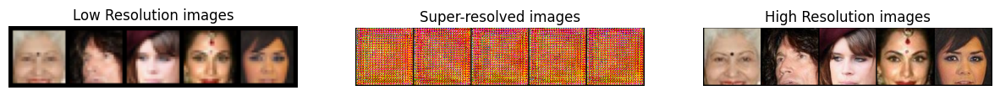

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

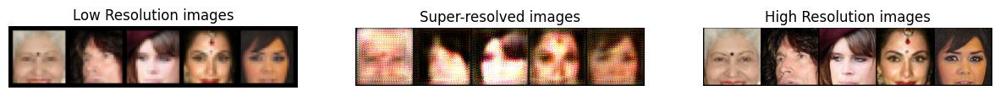

Validation: |          | 0/? [00:00<?, ?it/s]

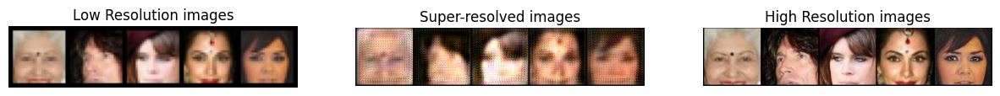

Validation: |          | 0/? [00:00<?, ?it/s]

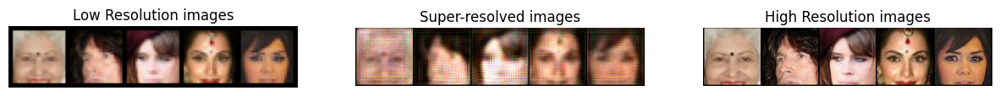

Validation: |          | 0/? [00:00<?, ?it/s]

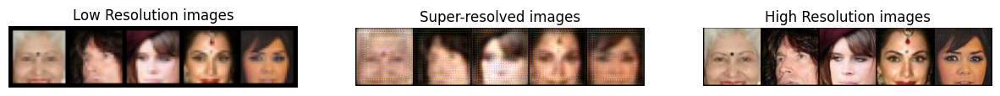

Validation: |          | 0/? [00:00<?, ?it/s]

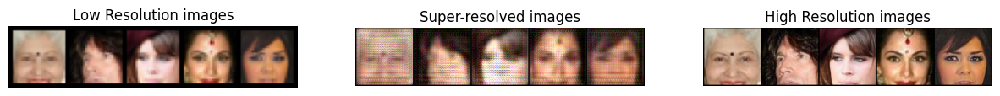

Validation: |          | 0/? [00:00<?, ?it/s]

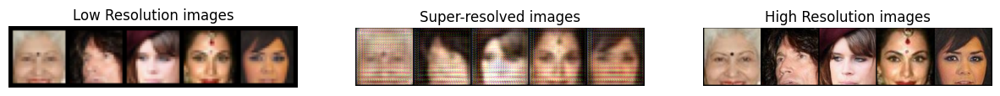

Validation: |          | 0/? [00:00<?, ?it/s]

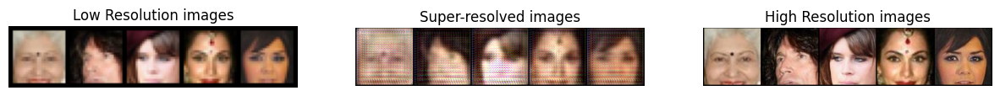

Validation: |          | 0/? [00:00<?, ?it/s]

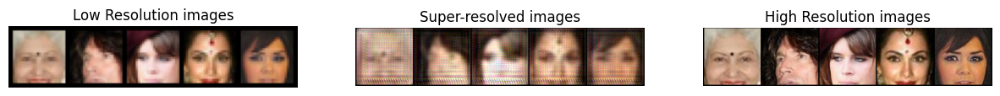

Validation: |          | 0/? [00:00<?, ?it/s]

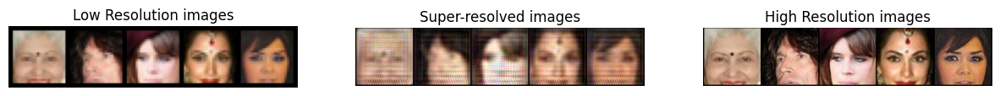

Validation: |          | 0/? [00:00<?, ?it/s]

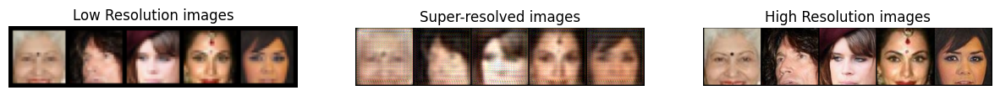

Validation: |          | 0/? [00:00<?, ?it/s]

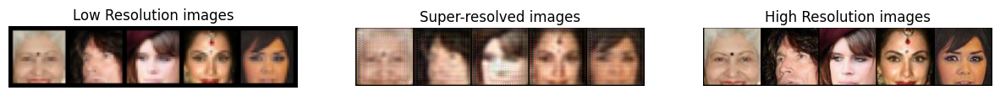

Validation: |          | 0/? [00:00<?, ?it/s]

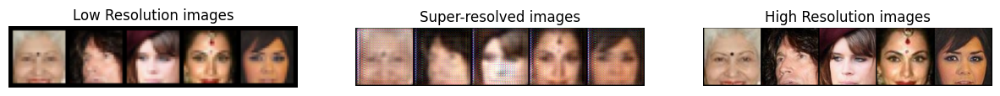

Validation: |          | 0/? [00:00<?, ?it/s]

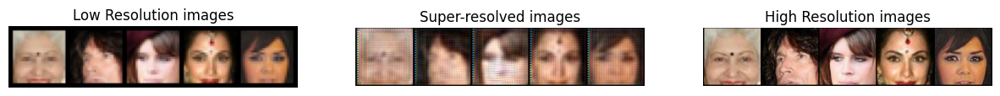

Validation: |          | 0/? [00:00<?, ?it/s]

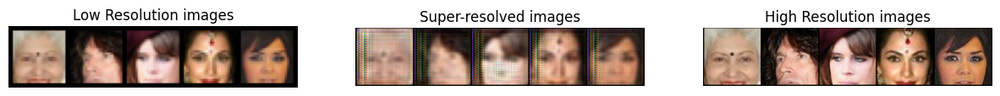

Validation: |          | 0/? [00:00<?, ?it/s]

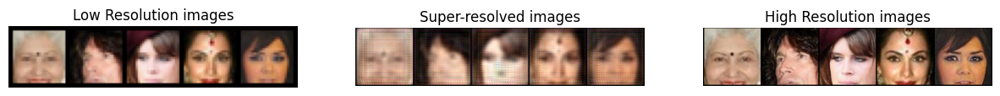

Validation: |          | 0/? [00:00<?, ?it/s]

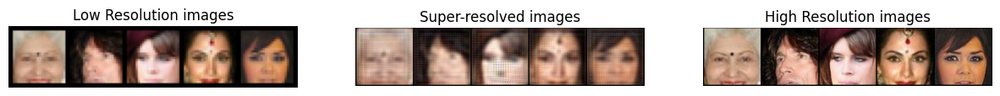

Validation: |          | 0/? [00:00<?, ?it/s]

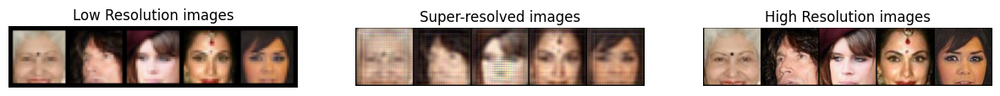

Validation: |          | 0/? [00:00<?, ?it/s]

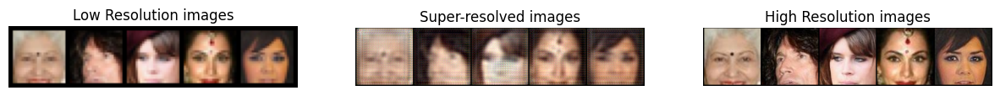

In [12]:
trainer.fit(model, train_loader, val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

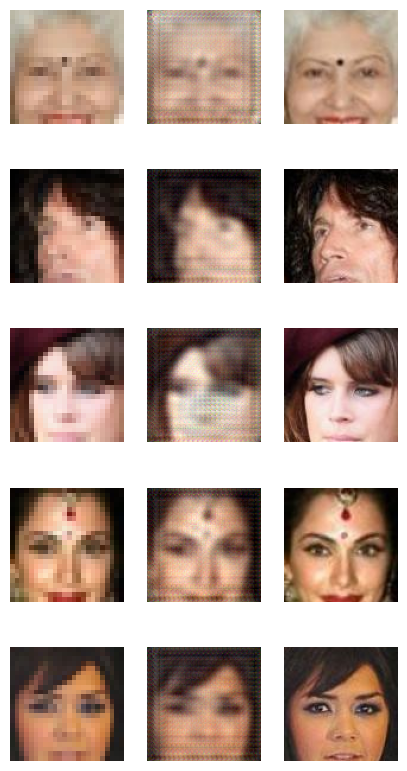

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test_psnr_epoch      │     19.93659782409668     │
│      test_ssim_epoch      │     0.450690358877182     │
└───────────────────────────┴───────────────────────────┘

[{'test_psnr_epoch': 19.93659782409668, 'test_ssim_epoch': 0.450690358877182}]

In [13]:
trainer.test(model, val_loader)

## Vanila generator, vanila discriminator, EMA off

In [11]:
# Initialize the generator and discriminator
generator = SRResNet(upscale=4, in_channels=3, out_channels=3, channels=64, num_rcb=16)
discriminator = DiscriminatorForVGG(in_channels=3, out_channels=1, channels=64)

model = LitGAN(
    generator, discriminator, control_set,
    output_epoch=1,
    load_pretrain_gen=False,
    load_pretrain_disc=False,
    perform_ema=False
)

# Initialize a model checkpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='val_G_content_error',
    dirpath='/kaggle/working/checkpoints',
    filename='my-model-{epoch:02d}-{val_G_content_error:.2f}',
    save_last=True,
    save_top_k=1,
    mode='min',
)

trainer = L.Trainer(
    max_epochs=18,
    enable_checkpointing=True,
#     callbacks=[RichProgressBar(), checkpoint_callback],
    callbacks=[checkpoint_callback],
    limit_train_batches=1266, # 1266
    limit_val_batches=128,
    limit_test_batches=128,
    logger=TensorBoardLogger('lightning_logs', name='gen_vanila_disc_vanila_ema_off')
)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 162MB/s]  
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:110: UserWarning: 'has_cuda' is deprecated, please use 'torch.backends.cuda.is_built()'
  torch.has_cuda,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:111: UserWarning: 'has_cudnn' is deprecated, please use 'torch.backends.cudnn.is_available()'
  torch.has_cudnn,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:117: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  torch.has_mps,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:118: UserWarning: 'has_mkldnn' is deprecated, please use 'torch.backends.mkldnn.is_available()'
  torch.has_mkldnn,


2024-05-31 19:49:10.846081: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 19:49:10.846178: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 19:49:10.976785: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type                | Params
---------------------------------------------------------
0 | generator        | SRResNet            | 1.5 M 
1 | discriminator    | DiscriminatorForVGG | 23.6 M
2 | pixel_loss       | MSELoss             | 0     
3 | content_loss     | ContentLoss         |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

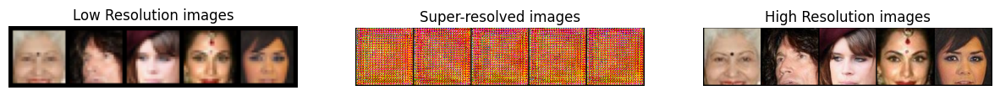

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

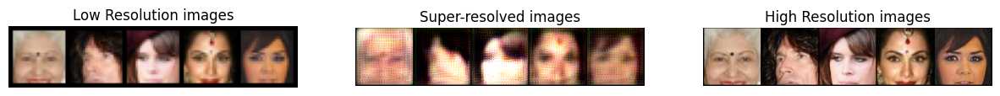

Validation: |          | 0/? [00:00<?, ?it/s]

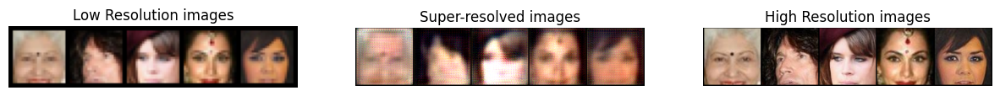

Validation: |          | 0/? [00:00<?, ?it/s]

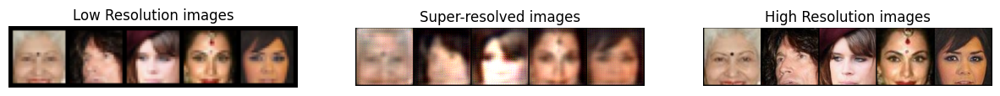

Validation: |          | 0/? [00:00<?, ?it/s]

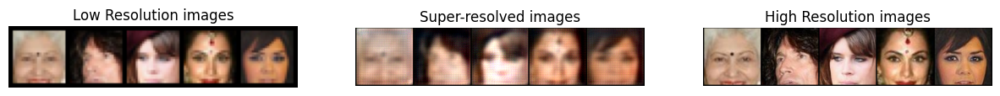

Validation: |          | 0/? [00:00<?, ?it/s]

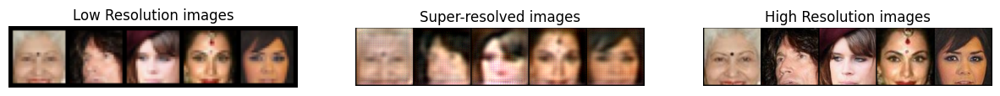

Validation: |          | 0/? [00:00<?, ?it/s]

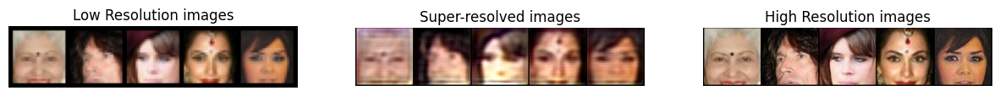

Validation: |          | 0/? [00:00<?, ?it/s]

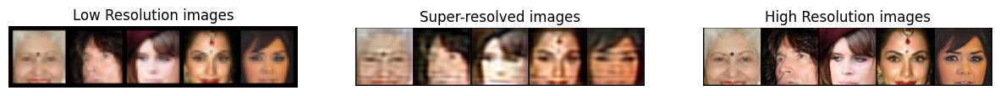

Validation: |          | 0/? [00:00<?, ?it/s]

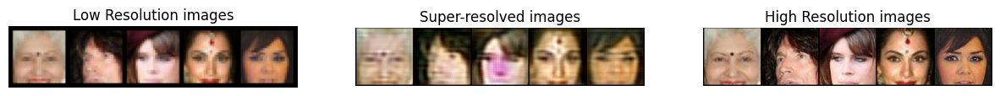

Validation: |          | 0/? [00:00<?, ?it/s]

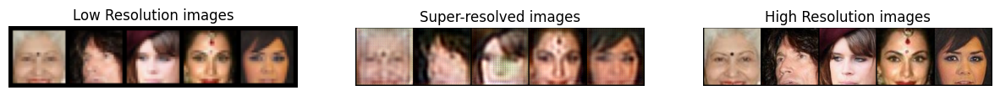

Validation: |          | 0/? [00:00<?, ?it/s]

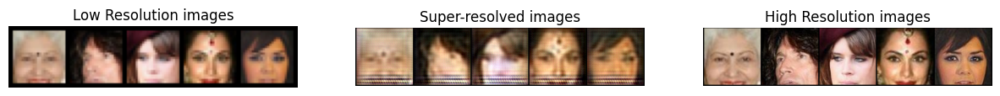

Validation: |          | 0/? [00:00<?, ?it/s]

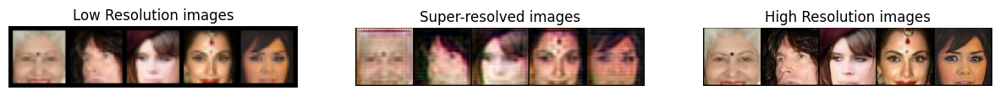

Validation: |          | 0/? [00:00<?, ?it/s]

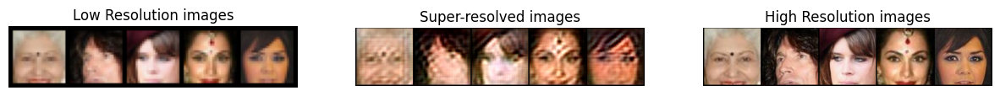

Validation: |          | 0/? [00:00<?, ?it/s]

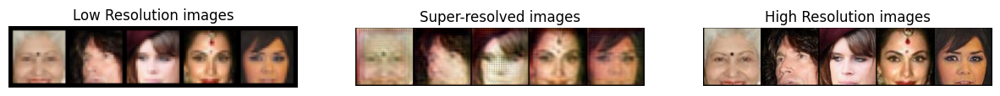

Validation: |          | 0/? [00:00<?, ?it/s]

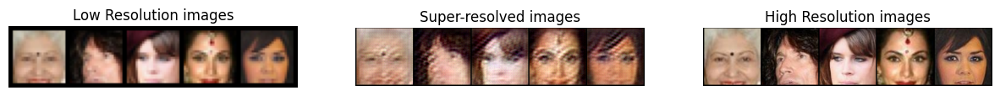

Validation: |          | 0/? [00:00<?, ?it/s]

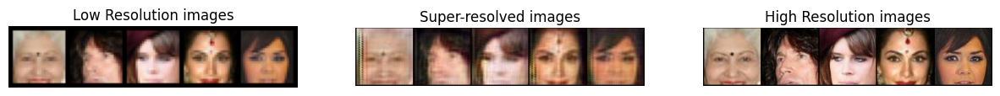

Validation: |          | 0/? [00:00<?, ?it/s]

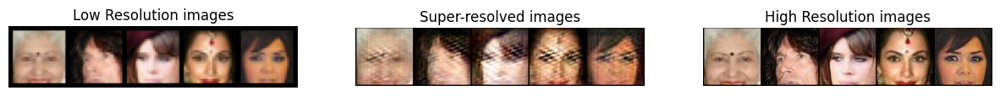

Validation: |          | 0/? [00:00<?, ?it/s]

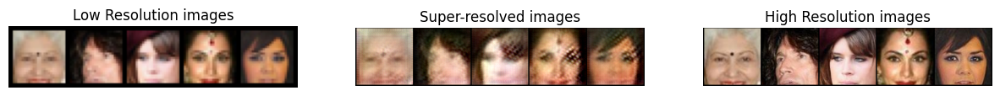

Validation: |          | 0/? [00:00<?, ?it/s]

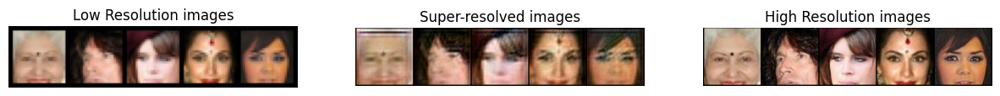

In [12]:
trainer.fit(model, train_loader, val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

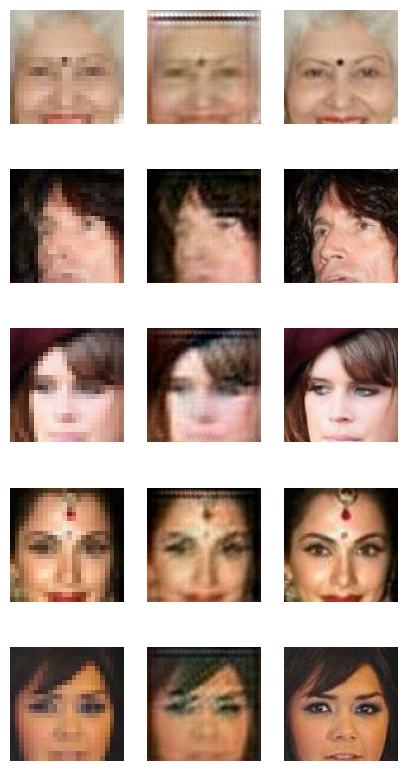

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test_psnr_epoch      │     20.78665542602539     │
│      test_ssim_epoch      │    0.5997834205627441     │
└───────────────────────────┴───────────────────────────┘

[{'test_psnr_epoch': 20.78665542602539, 'test_ssim_epoch': 0.5997834205627441}]

In [15]:
trainer.test(model, val_loader)

## Pretrained generator, vanila discriminator, EMA off

In [11]:
# Initialize the generator and discriminator
generator = SRResNet(upscale=4, in_channels=3, out_channels=3, channels=64, num_rcb=16)
discriminator = DiscriminatorForVGG(in_channels=3, out_channels=1, channels=64)

model = LitGAN(
    generator, discriminator, control_set,
    output_epoch=1,
    load_pretrain_gen=True,
    load_pretrain_disc=False,
    perform_ema=False
)

# Initialize a model checkpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='val_G_content_error',
    dirpath='/kaggle/working/checkpoints',
    filename='my-model-{epoch:02d}-{val_G_content_error:.2f}',
    save_last=True,
    save_top_k=1,
    mode='min',
)

trainer = L.Trainer(
    max_epochs=18,
    enable_checkpointing=True,
#     callbacks=[RichProgressBar(), checkpoint_callback],
    callbacks=[checkpoint_callback],
    limit_train_batches=1266, # 1266
    limit_val_batches=128,
    limit_test_batches=128,
    logger=TensorBoardLogger('lightning_logs', name='disc_vanila_ema_off')
)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 169MB/s]  
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:110: UserWarning: 'has_cuda' is deprecated, please use 'torch.backends.cuda.is_built()'
  torch.has_cuda,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:111: UserWarning: 'has_cudnn' is deprecated, please use 'torch.backends.cudnn.is_available()'
  torch.has_cudnn,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:117: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  torch.has_mps,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:118: UserWarning: 'has_mkldnn' is deprecated, please use 'torch.backends.mkldnn.is_available()'
  torch.has_mkldnn,


2024-05-31 17:52:58.771762: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 17:52:58.771892: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 17:52:58.900130: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type                | Params
---------------------------------------------------------
0 | generator        | SRResNet            | 1.5 M 
1 | discriminator    | DiscriminatorForVGG | 23.6 M
2 | pixel_loss       | MSELoss             | 0     
3 | content_loss     | ContentLoss         |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

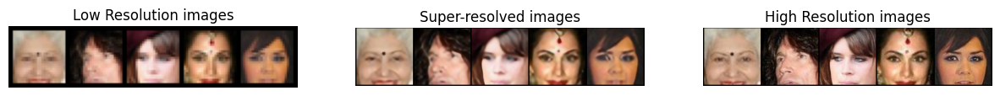

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

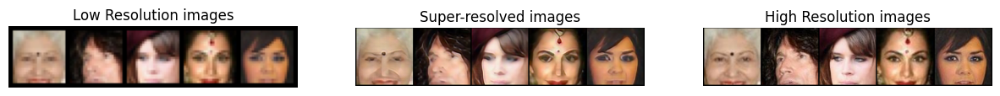

Validation: |          | 0/? [00:00<?, ?it/s]

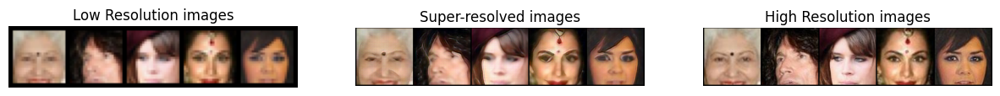

Validation: |          | 0/? [00:00<?, ?it/s]

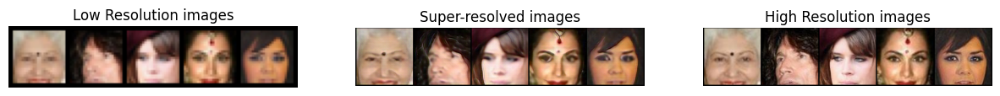

Validation: |          | 0/? [00:00<?, ?it/s]

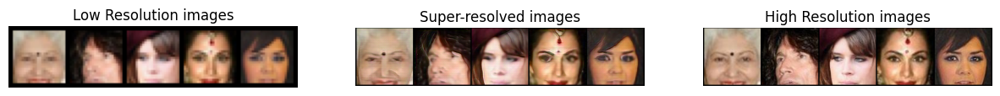

Validation: |          | 0/? [00:00<?, ?it/s]

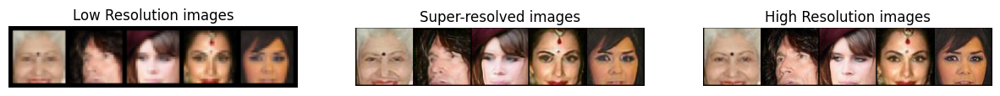

Validation: |          | 0/? [00:00<?, ?it/s]

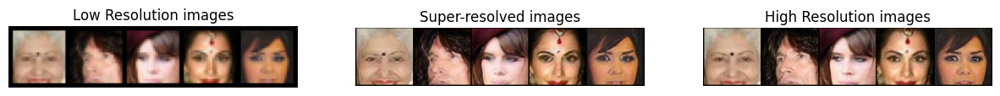

Validation: |          | 0/? [00:00<?, ?it/s]

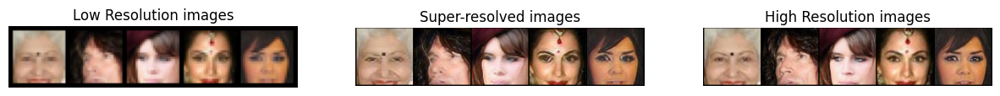

Validation: |          | 0/? [00:00<?, ?it/s]

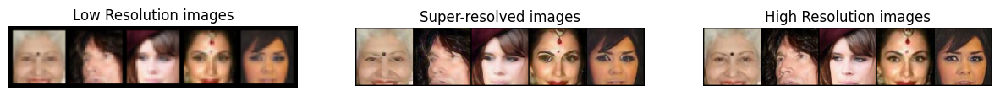

Validation: |          | 0/? [00:00<?, ?it/s]

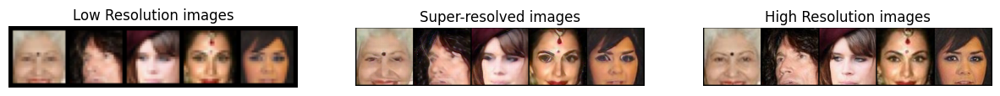

Validation: |          | 0/? [00:00<?, ?it/s]

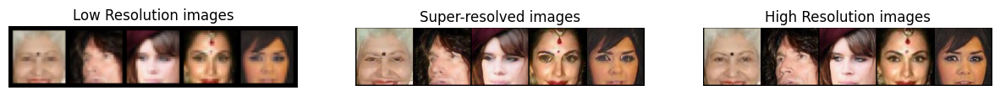

Validation: |          | 0/? [00:00<?, ?it/s]

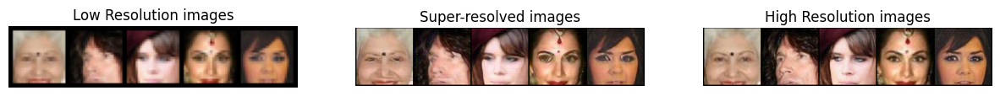

Validation: |          | 0/? [00:00<?, ?it/s]

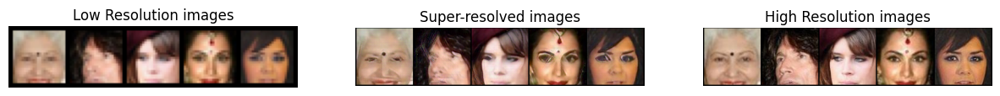

Validation: |          | 0/? [00:00<?, ?it/s]

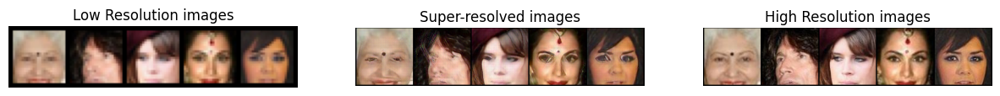

Validation: |          | 0/? [00:00<?, ?it/s]

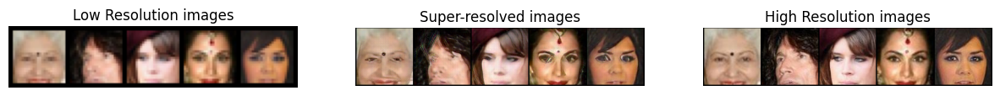

Validation: |          | 0/? [00:00<?, ?it/s]

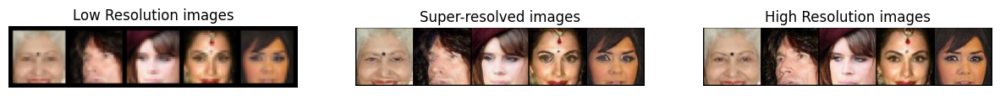

Validation: |          | 0/? [00:00<?, ?it/s]

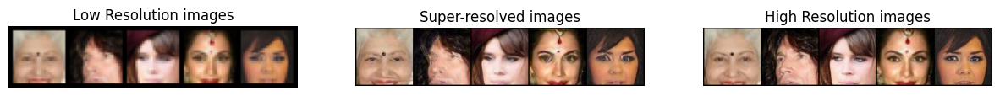

Validation: |          | 0/? [00:00<?, ?it/s]

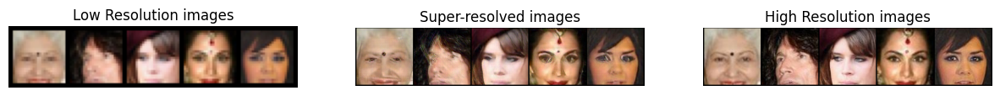

Validation: |          | 0/? [00:00<?, ?it/s]

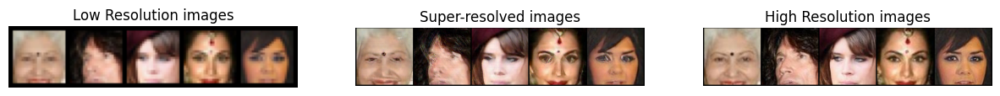

In [12]:
trainer.fit(model, train_loader, val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

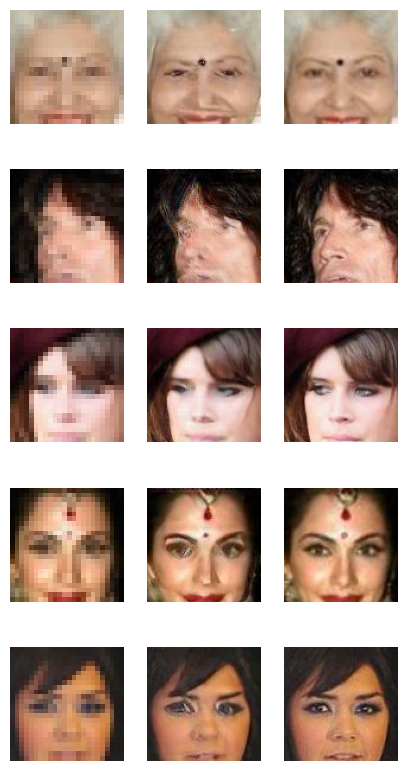

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test_psnr_epoch      │     23.61744499206543     │
│      test_ssim_epoch      │    0.7272135615348816     │
└───────────────────────────┴───────────────────────────┘

[{'test_psnr_epoch': 23.61744499206543, 'test_ssim_epoch': 0.7272135615348816}]

In [15]:
trainer.test(model, val_loader)

## Pretrained generator, vanila discriminator, EMA on

In [11]:
# Initialize the generator and discriminator
generator = SRResNet(upscale=4, in_channels=3, out_channels=3, channels=64, num_rcb=16)
discriminator = DiscriminatorForVGG(in_channels=3, out_channels=1, channels=64)

model = LitGAN(
    generator, discriminator, control_set,
    output_epoch=1,
    load_pretrain_gen=True,
    load_pretrain_disc=False,
    perform_ema=True
)

# Initialize a model checkpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='val_G_content_error',
    dirpath='/kaggle/working/checkpoints',
    filename='my-model-{epoch:02d}-{val_G_content_error:.2f}',
    save_last=True,
    save_top_k=1,
    mode='min',
)

trainer = L.Trainer(
    max_epochs=18,
    enable_checkpointing=True,
#     callbacks=[RichProgressBar(), checkpoint_callback],
    callbacks=[checkpoint_callback],
    limit_train_batches=1266, # 1266
    limit_val_batches=128,
    limit_test_batches=128,
    logger=TensorBoardLogger('lightning_logs', name='disc_vanila_ema_on')
)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:04<00:00, 142MB/s]  
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:110: UserWarning: 'has_cuda' is deprecated, please use 'torch.backends.cuda.is_built()'
  torch.has_cuda,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:111: UserWarning: 'has_cudnn' is deprecated, please use 'torch.backends.cudnn.is_available()'
  torch.has_cudnn,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:117: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  torch.has_mps,
/opt/conda/lib/python3.10/site-packages/torch/overrides.py:118: UserWarning: 'has_mkldnn' is deprecated, please use 'torch.backends.mkldnn.is_available()'
  torch.has_mkldnn,


2024-05-31 18:51:39.454519: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 18:51:39.454645: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 18:51:39.590281: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type                | Params
---------------------------------------------------------
0 | generator        | SRResNet            | 1.5 M 
1 | discriminator    | DiscriminatorForVGG | 23.6 M
2 | pixel_loss       | MSELoss             | 0     
3 | content_loss     | ContentLoss         |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

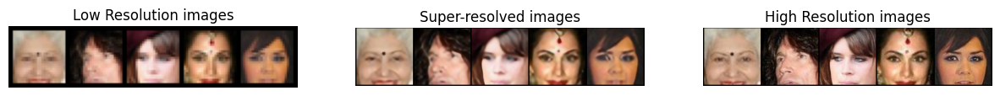

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

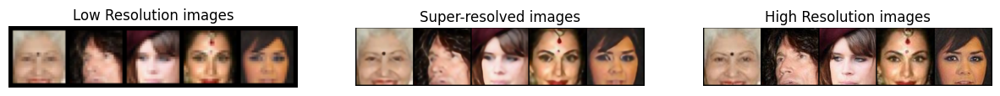

Validation: |          | 0/? [00:00<?, ?it/s]

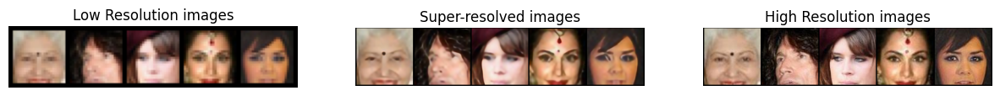

Validation: |          | 0/? [00:00<?, ?it/s]

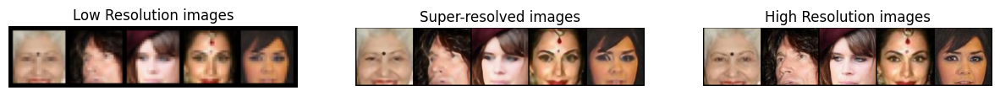

Validation: |          | 0/? [00:00<?, ?it/s]

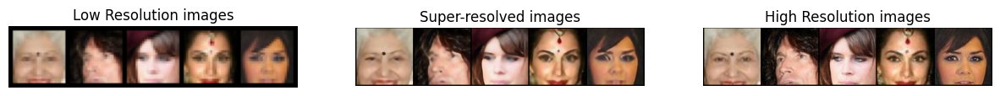

Validation: |          | 0/? [00:00<?, ?it/s]

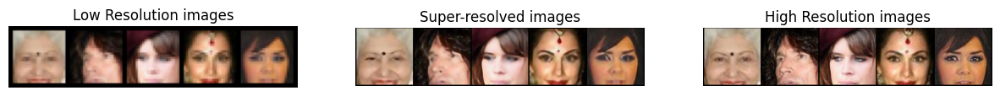

Validation: |          | 0/? [00:00<?, ?it/s]

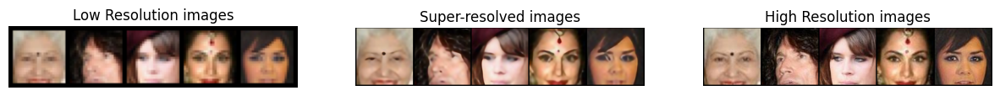

Validation: |          | 0/? [00:00<?, ?it/s]

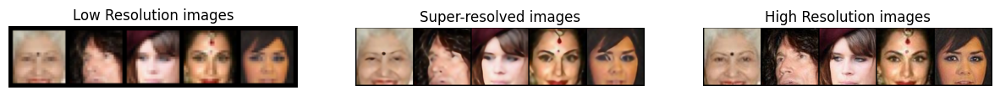

Validation: |          | 0/? [00:00<?, ?it/s]

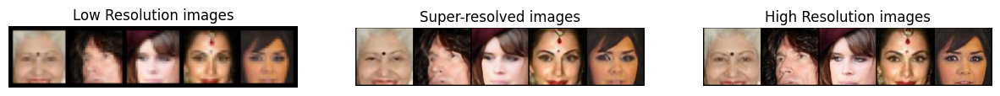

Validation: |          | 0/? [00:00<?, ?it/s]

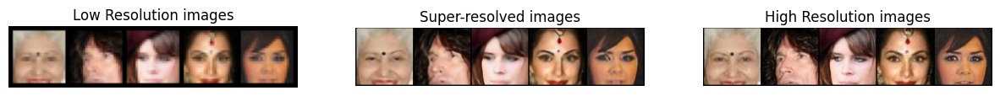

Validation: |          | 0/? [00:00<?, ?it/s]

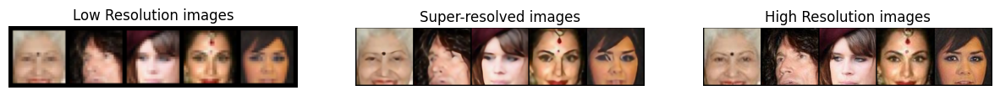

Validation: |          | 0/? [00:00<?, ?it/s]

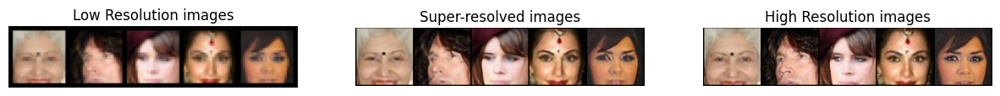

Validation: |          | 0/? [00:00<?, ?it/s]

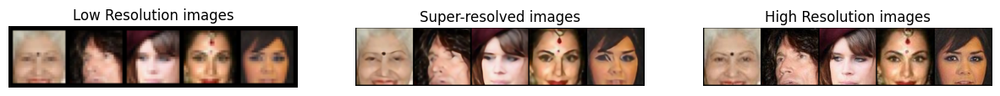

Validation: |          | 0/? [00:00<?, ?it/s]

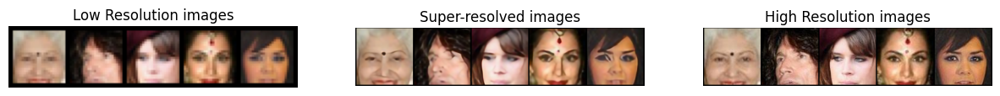

Validation: |          | 0/? [00:00<?, ?it/s]

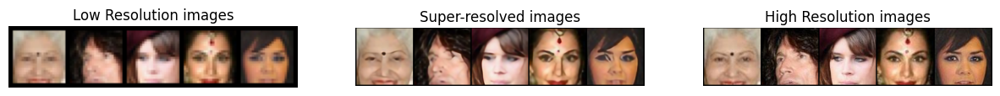

Validation: |          | 0/? [00:00<?, ?it/s]

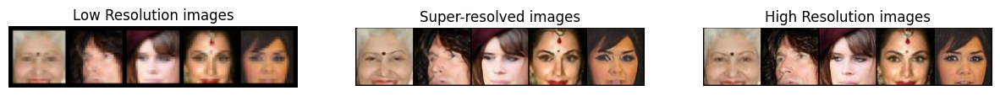

Validation: |          | 0/? [00:00<?, ?it/s]

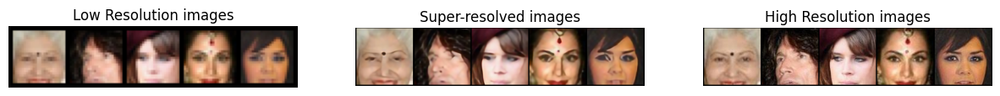

Validation: |          | 0/? [00:00<?, ?it/s]

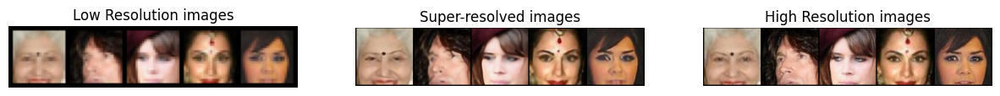

Validation: |          | 0/? [00:00<?, ?it/s]

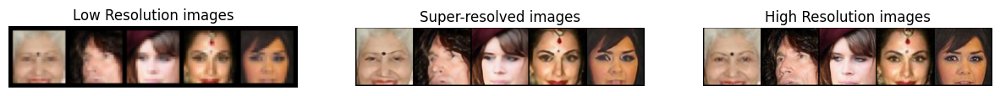

In [12]:
trainer.fit(model, train_loader, val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

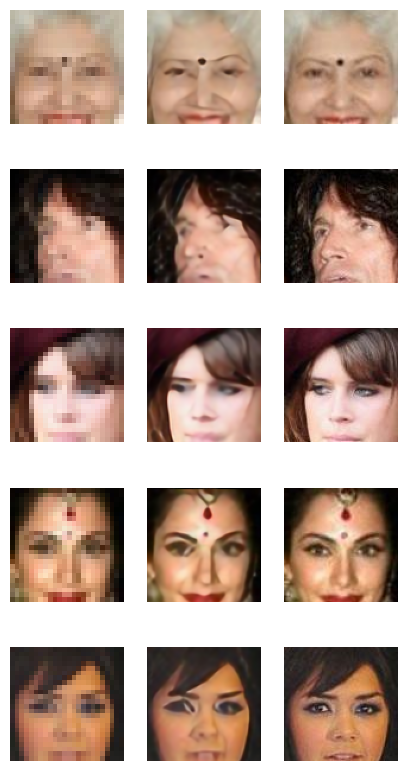

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test_psnr_epoch      │    23.157527923583984     │
│      test_ssim_epoch      │    0.7513720393180847     │
└───────────────────────────┴───────────────────────────┘

[{'test_psnr_epoch': 23.157527923583984,
  'test_ssim_epoch': 0.7513720393180847}]

In [15]:
trainer.test(model, val_loader)

In [13]:
!zip -r /kaggle/working/checkpoints /kaggle/working/checkpoints

  adding: kaggle/working/checkpoints/ (stored 0%)
  adding: kaggle/working/checkpoints/my-model-epoch=07-val_G_content_error=0.72.ckpt (deflated 8%)
  adding: kaggle/working/checkpoints/last.ckpt (deflated 8%)


In [14]:
!zip -r /kaggle/working/lightning_logs.zip /kaggle/working/lightning_logs

  adding: kaggle/working/lightning_logs/ (stored 0%)
  adding: kaggle/working/lightning_logs/gen_vanila_disc_vanila_ema_off/ (stored 0%)
  adding: kaggle/working/lightning_logs/gen_vanila_disc_vanila_ema_off/version_0/ (stored 0%)
  adding: kaggle/working/lightning_logs/gen_vanila_disc_vanila_ema_off/version_0/events.out.tfevents.1717184959.f303324b108d.35.0 (deflated 73%)
  adding: kaggle/working/lightning_logs/gen_vanila_disc_vanila_ema_off/version_0/hparams.yaml (stored 0%)


In [24]:
best_checkpoint_path = checkpoint_callback.best_model_path
check_model =  LitGAN.load_from_checkpoint(
    generator=generator,
    discriminator=discriminator,
    control_set=control_set,
    output_epoch=1,
    load_pretrain=True,
    perform_ema=True,checkpoint_path=best_checkpoint_path)

In [ ]:
trainer.test(check_model, val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()